# Import Dependencies

In [23]:
import pandas as pd
from config import CSV_FILE_URL
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from heatmap import heatmap, corrplot

# Read the CSV

In [2]:
# Read the CSV file into a dataframe
df = pd.read_csv(CSV_FILE_URL)
df.shape

(284807, 31)

# Data Cleaning

Checking to see if there are any null values in the dataset. 

In [3]:
# Drop the null columns where all values are null
df = df.dropna(axis='columns', how='all')

# Drop the null rows
df = df.dropna()
df.shape

(284807, 31)

It could be seen that there are **no null values** in the dataset.

# Data Exploration

Checking Data distribution w.r.t Target feature

In [4]:
df.groupby('Class').count()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,
0,284315,284315,284315,284315,284315,284315,284315,284315,284315,284315,...,284315,284315,284315,284315,284315,284315,284315,284315,284315,284315
1,492,492,492,492,492,492,492,492,492,492,...,492,492,492,492,492,492,492,492,492,492


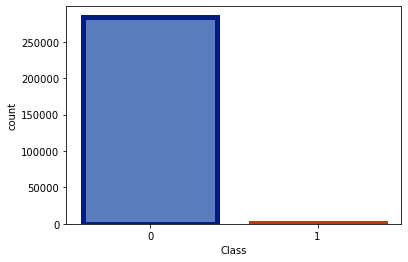

In [5]:
sns.countplot(x='Class',data=df, palette='muted',linewidth=5,edgecolor=sns.color_palette("dark", 3))

It is evident from the above plot that data is **highly imbalanced**. The dataset has only 492 fraudulent transactions out of a total of 284,807 transactions, which is a mere **0.17%**.

Text(0, 0.5, 'Time (s)')

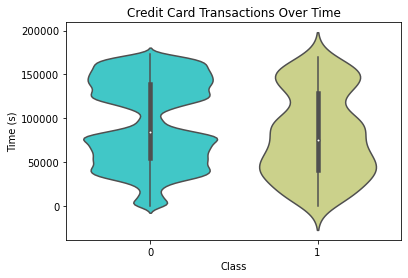

In [18]:
ax = sns.violinplot(x="Class", y="Time", data=df, palette='rainbow', showfliers=False)
ax.set_title('Credit Card Transactions Over Time')
plt.xlabel('Class')
plt.ylabel('Time (s)')

It could be seen from the above plot that the number of genuine transactions during nighttime in European Timezone had been too low while the fraudulent transactions were uniformly distributed even through the nighttime. 

Text(0.5, 1.0, 'Credit Card Transaction Amount - Boxplot without Outliers')

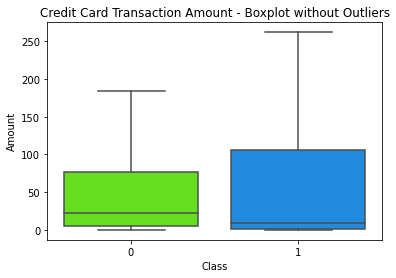

In [20]:
ax = sns.boxplot(x="Class", y="Amount", data=df, palette='gist_rainbow', showfliers=False)
ax.set_title('Credit Card Transaction Amount - Boxplot without Outliers')

Text(0.5, 1.0, 'Credit Card Transaction Amount - Boxplot with Outliers')

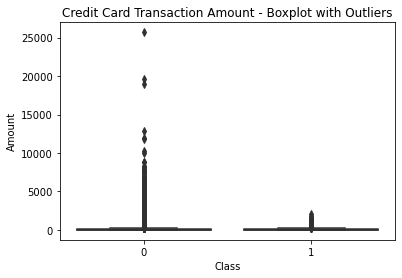

In [21]:
ax = sns.boxplot(x="Class", y="Amount", data=df, palette='icefire', showfliers=True)
ax.set_title('Credit Card Transaction Amount - Boxplot with Outliers')

It is evident from the above boxplots that median and maximum transaction amount for fraudulent transactions were low compared to genuine transactions.

# Feature Correlation Matrix

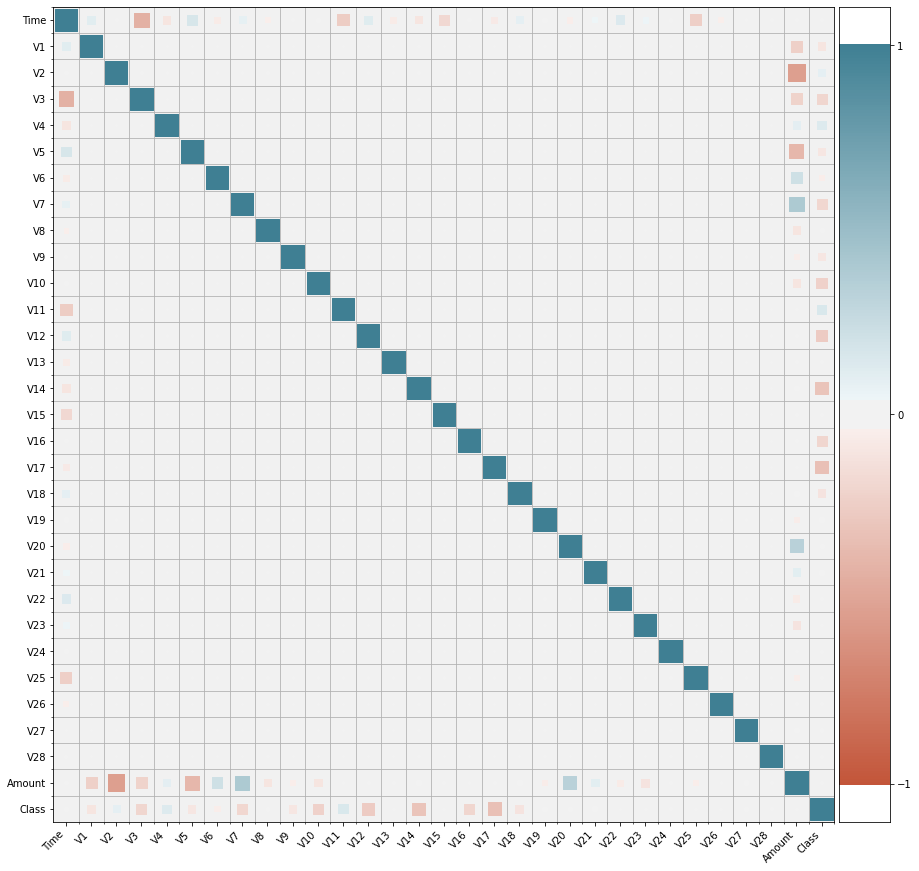

In [29]:
plt.figure(figsize=(15,15))
corrplot(df.corr(), size_scale=500)

We could notice the following direct and inverse correlations between features from the below correlation matrix:
- There is no correlation between features V1-V28.
- Correlations with feature "Time"
    - Feature "V3" has inverse correlation with feature "Time".
    - Features "V11" and "V25" have slight inverse correlation with feature "Time".
    - Features "V5" and "V22" seem to have slight direct correlation with feature "Time".
- Correlations with feature "Amount"
    - Feature "V2" has inverse correlation with feature "Amount".
    - Features "V5", "V1" and "V3" have slight inverse correlation with feature "Amount".
    - Features "V7" and "V20" have direct correlation with feature "Amount".
- Correlations with Target feature "Class"
    - Feature "V17" has inverse correlation with feature "Class".
    - Features "V14", "V12", "V10", "V7", "V3" and "V16" have slight inverse correlation with feature "Class".
    - Features "V4" and "V11" has very slight direct correlation with feature "Class".

Let's plot the correlated and inverse correlated values on a graph.

<Figure size 1440x1440 with 0 Axes>

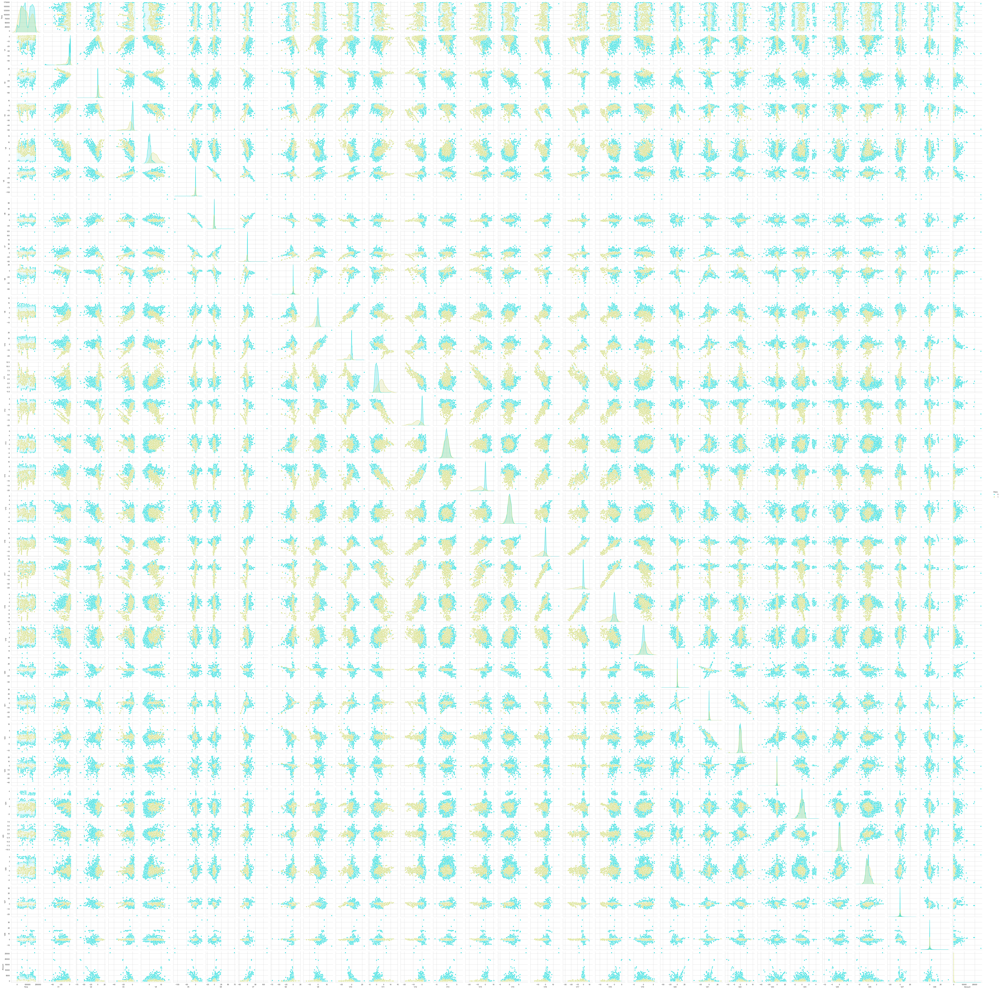

In [45]:
plt.figure(figsize = (20,20))
sns.pairplot(df,hue='Class',palette='rainbow')

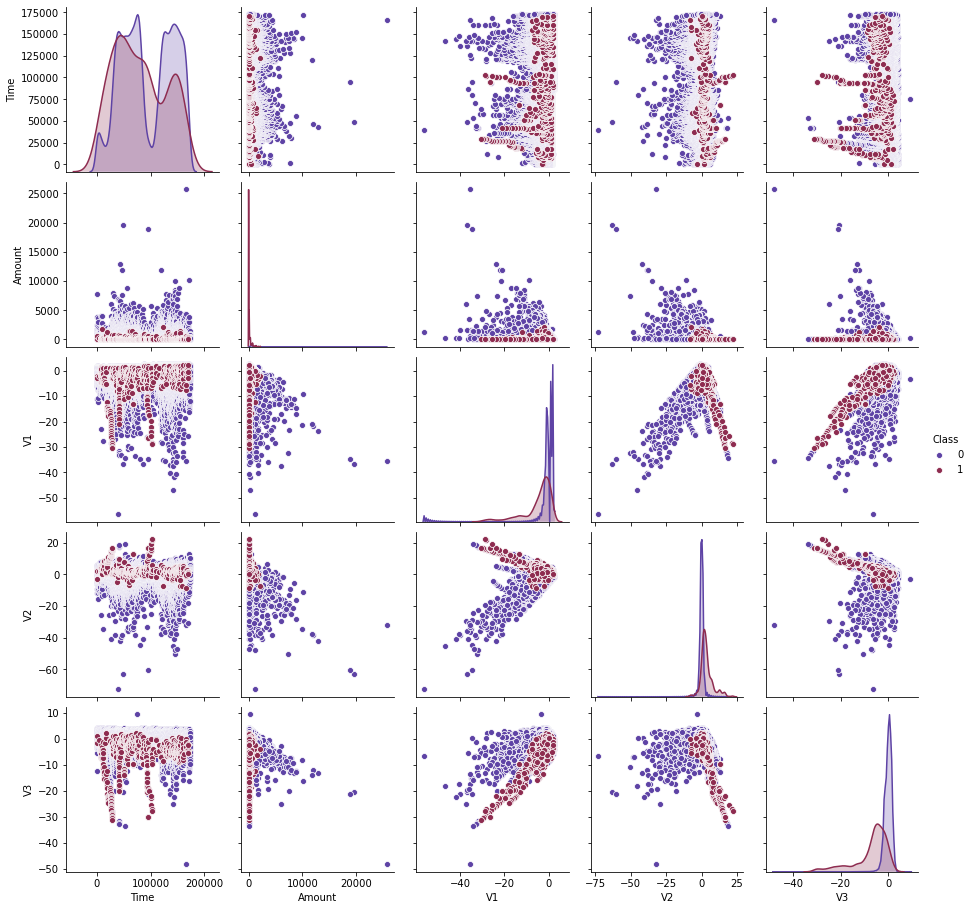

In [14]:
sns.pairplot(df[["Time", "Amount", "V1","V2","V3", "Class"]],hue='Class',palette='twilight')